# Why NB36 stopped being profitable: weights, pairs and positions

`36-backtest-gated-inverse-vol-max6.ipynb` on the vault price data as it stood on 2026-07-23
against the same strategy on the data as it stands on 2026-08-07. The 2026-07-23 vintage was
restored from backup; both runs use trade-executor at or after `74bd4c35` and freshly computed
indicator caches.

## Key new insights and what did we learn from this experiment?

### The vaults did not get worse. The strategy stopped picking them.

This is the whole answer, and the cross-application test makes it unambiguous. Take each run's
daily portfolio weights and each vintage's daily vault returns, then compute the portfolio return
for all four combinations:

| Weights from | Returns from | Cumulative return |
|---|---|---:|
| vintage 2026-07-23 | vintage 2026-07-23 | 5.78% |
| vintage 2026-07-23 | **current 2026-08-07** | **5.78%** |
| current 2026-08-07 | vintage 2026-07-23 | 4.26% |
| current 2026-08-07 | current 2026-08-07 | 4.26% |

**Swapping the returns changes nothing. Swapping the weights changes everything.** Holding the
vintage allocation fixed and feeding it current prices gives exactly the vintage result; letting
the strategy re-select on current data is what costs the return.

The pair table confirms it directly: for every vault the strategy actually traded, the in-window
return is **identical** in both vintages - Realist Capital +502% in both, pmalt +138% in both,
Goon Edgington +77% in both, LowRiskCryptoGainer +19% in both, 22Cap +24% in both. Not one traded
vault was revised.

### What changed is the ranking pool, not the holdings

The cross-section the ranking chooses from shrank from **572 to 350 vaults** with in-window price
history. That reshuffles which names clear the top-six composite score and when, even though the
survivors' price series are untouched. The consequence, per vault:

| What became of it | Vaults | PnL vintage | PnL current | Lost |
|---|---:|---:|---:|---:|
| Present with identical data, **never selected** | 3 | $2,602 | $0 | **-$2,602** |
| Still traded, earned less | 7 | $7,045 | $3,125 | -$3,921 |
| Still traded, earned same or more | 4 | $767 | $2,318 | +$1,551 |
| Dropped from the dataset | 1 | $125 | $0 | -$125 |

**Vaults disappearing from the dataset is a red herring** - it accounts for $125. The damage is
three untouched winners the ranking no longer promotes (Goon Edgington -$1,314,
LowRiskCryptoGainer -$1,241) and seven winners the strategy now under-allocates to (Realist
Capital $2,489 -> $676 on the same +502% price series, across the same four positions).

### The strategy did not become riskier, only less profitable

Maximum drawdown is essentially unchanged, -7.7% versus -7.1%. Earlier readings of -14% and -20%
were cache corruption, not data (see Robustness). The gate, the caps and the breadth rules all
still work; the basket simply holds a slightly worse-ranked six.

## Summary of results

Period 2025-08-01 to 2026-07-09, $25,000 start, six-vault gated inverse-volatility basket.

| Metric | vintage 2026-07-23 | current 2026-08-07 |
|---|---:|---:|
| Final equity | $31,315 | $28,774 |
| Cumulative return | 25.3% | 15.1% |
| Maximum drawdown | -7.7% | -7.1% |
| Distinct positions | 101 | 95 |
| Trades | 1,279 | 1,257 |
| Position win rate | 47.5% | 44.2% |
| Mean winning position | $284 | $209 |
| Mean losing position | -$174 | -$89 |
| Total position PnL | $6,692 | $4,343 |

### Asset weights

| | vintage | current |
|---|---:|---:|
| Mean vaults held | 6.00 | 5.91 |
| Minimum vaults held | 6 | 5 |
| Mean largest position weight | 40.2% | 45.8% |
| Maximum largest position weight | 51.0% | 52.7% |
| Mean invested capital | $27,928 | $26,984 |

The current run cannot always fill six slots (minimum 5 against a constant 6), and leans harder on
its top name (45.8% average against 40.2%). Fewer qualifying candidates means more concentration
into a worse-ranked basket - the mechanism by which a thinner ranking pool hurts.

### Positions

Both runs trade the same way: 1,279 versus 1,257 trades, median holding period 8 days in both. The
difference is quality, not activity - the win rate slips 47.5% to 44.2% and the mean winner
shrinks from $284 to $209. 14 vaults are traded only on vintage data (37 positions, +$1,874) and 14
only on current data (37 positions, **-$734**): the substitutes the ranking found are worse than
the names they replaced.

## Robustness of results

- **Both legs use freshly computed indicator caches.** This matters more than it sounds. The
  indicator cache key fix (`74bd4c35`) renames per-pair entries but **not** universe-level ones
  (`inclusion_criteria`, `tvl_included_pair_count`, `tvl_inclusion_criteria`,
  `trading_availability_criteria`), which keep the literal name `-universe.parquet`. A cache
  directory written before the fix therefore serves stale, collision-corrupted universe-level
  indicators to a corrected run. Those four files were deleted before this run.
- Earlier figures in this notebook chain were produced from such mixed caches and are wrong. For
  the record: the committed NB36 headline of $32,793 was reproduced exactly only by a mixed cache;
  a clean fixed-library run on the same 2026-07-23 data gives $31,315, reproduced twice
  independently. The reported max drawdowns of -14% and -20% on current data were also cache
  artefacts - the clean value is -7.1%.
- The cross-application test is approximate in level: reconstructed daily weights are resampled,
  shifted one day and exclude reserves, so its cumulative returns (5.78% / 4.26%) are lower than
  the backtest's (25.3% / 15.1%). The comparison between cells is what carries the conclusion, and
  the identical-by-column result is exact, not marginal.
- 46 vaults were traded across both runs out of 572 with price history, so the per-vault tables
  cover the entire traded set rather than a sample.
- Both runs share one library version and one code path; the only variable is the price vintage.

## What this means

The strategy's logic is intact and its risk control still works. What degraded is the **quality of
the candidate pool**: 222 fewer vaults with usable history means the top-six selection lands on
weaker names, holds them at higher concentration, and occasionally cannot fill the basket at all.

If the shrunken pool reflects reality - vaults genuinely delisted or never real - then NB36's
2026-07-23 edge was partly harvested from vaults that should not have been investable, and the
current 15.1% is the honest number. If instead the 222 vaults were dropped by a data-pipeline
change, the edge may still exist and the pipeline is hiding it. **Establishing which of those two
is true is the highest-value next step**, and it is a data-provenance question rather than a
strategy question.


## Notebook setup

- Shared imports, chart output settings, and notebook logging for the clean-up variant.

In [1]:
import datetime
import logging

import numpy as np
import pandas as pd
import plotly.express as px
from IPython.display import display

from tradingstrategy.client import Client
from tradeexecutor.utils.notebook import setup_charting_and_output, OutputMode

client = Client.create_jupyter_client()
setup_charting_and_output(OutputMode.static, image_format='png', width=1500, height=1000)
logger = logging.getLogger('strategy')

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Universe definition

- Use the same Hyperliquid survivor-first vault universe as NB152 so the clean-up stays directly comparable.

In [2]:
from eth_defi.token import USDC_NATIVE_TOKEN
from tradingstrategy.chain import ChainId
from tradeexecutor.state.identifier import AssetIdentifier

CHAIN_ID = ChainId.hyperliquid

EXCHANGES = ('uniswap-v2', 'uniswap-v3')
SUPPORTING_PAIRS = [
    (ChainId.arbitrum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WBTC', 'USDC', 0.003),
]
LENDING_RESERVES = None
PREFERRED_STABLECOIN = AssetIdentifier(
    chain_id=ChainId.hyperliquid.value,
    address=USDC_NATIVE_TOKEN[ChainId.hyperliquid].lower(),
    token_symbol='USDC',
    decimals=6,
)
ALLOWED_VAULT_DENOMINATION_TOKENS = {'USDC', 'USDT', 'USDC.e', 'crvUSD', 'USDT0', 'USD₮0', 'USDt', 'USDS'}

print(f'Chain universe: {CHAIN_ID.get_name()}')
print(f'Reserve asset: {PREFERRED_STABLECOIN}')


Chain universe: HyperEVM
Reserve asset: <USDC at 0xb88339cb7199b77e23db6e890353e22632ba630f>


## Parameters

- Keep the strategy parameters identical to `02-backtest-until-2026-07-09.ipynb`, except reduce initial capital to `25,000 USD`.


In [3]:
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradeexecutor.strategy.parameters import StrategyParameters
from tradingstrategy.timebucket import TimeBucket


class Parameters:
    #: Notebook identifier.
    id = '36-backtest-gated-inverse-vol-max6'

    #: Daily candles match the whole Hyperliquid survivor-first research chain.
    candle_time_bucket = TimeBucket.d1
    #: Daily rebalance cadence is the validated schedule used across the research chain.
    cycle_duration = CycleDuration.cycle_1d
    #: HyperEVM is the primary chain for vaults.
    chain_id = CHAIN_ID
    #: HyperEVM is the primary execution chain.
    primary_chain_id = CHAIN_ID
    #: Same exchange set as the release-candidate notebooks.
    exchanges = EXCHANGES

    #: Six-vault basket per the NB35 breadth study: one slot wider than the NB29 #48
    #: optimum. Halves max drawdown vs 5 vaults by keeping fresh-entry blow-ups (IKAGI,
    #: 2026-06-17) position-sized, at a ~4.5pp CAGR cost.
    max_assets_in_portfolio = 6
    #: 98% target deployment, the validated release default.
    allocation_pct = 0.98
    #: Concentration ceiling per position. Binds in ~24% of cycles under inverse-vol
    #: sizing and costs ~3pp in-sample CAGR (NB31); kept deliberately as live-trading
    #: insurance rather than a return driver.
    max_concentration_pct = 0.50
    #: Cap position size to this share of vault TVL. NB31 showed removing it *hurts*
    #: returns, so the backtest does not depend on unrealistic pool shares.
    per_position_cap_of_pool_pct = 0.15
    #: Engine hygiene threshold for cleaning up tiny residual positions.
    min_portfolio_weight_pct = 0.005

    #: Hyperliquid has a hard 5 USD minimum deposit.
    absolute_min_vault_deposit_usd = 5.0
    #: Buy threshold as a fraction of initial cash.
    individual_rebalance_min_threshold_of_initial_cash_pct = 0.0005
    #: Sell threshold as a fraction of initial cash.
    sell_rebalance_min_threshold_of_initial_cash_pct = 0.0001

    #: Survivor-first TVL floor selected in NB141.
    min_tvl_usd = 7_500

    #: Trailing window (days) for the CAGR leg of the composite selection score.
    cagr_lookback_days = 360
    #: Trailing window (days) for the Sharpe leg of the composite selection score.
    sharpe_lookback_days = 180
    #: Composite blend: ``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score``.
    #: NB31 showed both legs are load-bearing: either leg alone is materially worse on
    #: both CAGR and drawdown.
    cagr_weight = 0.50
    #: Momentum gate window: a vault is eligible only while its trailing return over
    #: this window exceeds :py:attr:`gate_threshold`. NB31: pure drawdown insurance at
    #: zero return cost (removal: -4.5pp CAGR and max DD -7.4% -> -17.5%).
    gate_lookback_days = 14
    #: Momentum gate threshold (fraction).
    gate_threshold = -0.08
    #: Rolling window for the inverse-volatility sizing weight. NB31: the single
    #: biggest contributor - equal weight halves CAGR and triples drawdown.
    inverse_vol_window = 60

    #: August 2025 remains the canonical mature-universe start.
    backtest_start = datetime.datetime(2025, 8, 1)
    #: Exclusive end boundary.
    backtest_end = datetime.datetime(2026, 7, 10)
    #: Release-candidate bankroll.
    initial_cash = 25_000
    #: Derived at class creation time from the configured initial cash and the 5 USD hard floor.
    individual_rebalance_min_threshold_usd = max(
        absolute_min_vault_deposit_usd,
        initial_cash * individual_rebalance_min_threshold_of_initial_cash_pct,
    )
    #: Derived at class creation time from the configured initial cash and the 5 USD hard floor.
    sell_rebalance_min_threshold_usd = max(
        absolute_min_vault_deposit_usd,
        initial_cash * sell_rebalance_min_threshold_of_initial_cash_pct,
    )

    #: Backtests do not model managed yield.
    use_managed_yield = False

    #: Default routing is still required by the strategy runtime even though it is not the alpha source.
    routing = TradeRouting.default
    #: Set deliberately high so live and notebook indicator calculations use effectively
    #: all available history; history-derived indicators would be silently biased by a
    #: truncated lookback window.
    required_history_period = datetime.timedelta(days=365 * 20)
    #: Same live-style slippage assumption as the release-candidate notebooks.
    slippage_tolerance_pct = 0.0060
    #: Assume no liquidity if there is a gap in TVL data.
    assummed_liquidity_when_data_missings_usd = 0.01


parameters = StrategyParameters.from_class(Parameters)


## Trading universe

- Build the tradable supporting-pair and Hyperliquid vault universe used by the backtest.

In [4]:
from pathlib import Path
import shutil
import time

#: Vault price vintage the next create_trading_universe() call reads. None = shared cache.
VAULT_HISTORY_DOWNLOAD_ROOT = None

from dotenv import load_dotenv
from tradingstrategy.utils.token_filter import filter_for_selected_pairs
from tradeexecutor.analysis.pair import display_strategy_universe
from tradeexecutor.strategy.execution_context import notebook_execution_context
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data, load_vault_universe_with_metadata
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.utils.notebook import display_dataframe_with_html, display_head_and_tail

from tradeexecutor.curator import build_hyperliquid_vault_universe

load_dotenv(override=True)


def create_trading_universe(
    input: CreateTradingUniverseInput,
) -> TradingStrategyUniverse:
    """Create the release-candidate trading universe.

    Keep the backtest trading window fixed to `Parameters.backtest_start` /
    `Parameters.backtest_end`, but let `required_history_period` extend the
    data-loading window backwards so age and other history-derived indicators
    can see the full pre-backtest history for the selected vaults.
    """
    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    parameters = input.parameters or Parameters
    universe_options = input.universe_options

    debug_printer = logger.info if execution_context.live_trading else print

    chain_id = parameters.primary_chain_id
    debug_printer(f'Preparing trading universe on chain {chain_id.get_name()}')

    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df = filter_for_selected_pairs(all_pairs_df, SUPPORTING_PAIRS)
    debug_printer(f'We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy')

    # Full, non-survivorship-biased universe: `top_n=None` still applies the
    # 120-vault CAGR cap baked into `CHAIN_CONFIG[9999]["top_n"]`, so pass an
    # explicit oversized `top_n` to keep every eligible Hyperliquid vault.
    source_vaults = build_hyperliquid_vault_universe(
        min_tvl=parameters.min_tvl_usd,
        min_age=0.0,
        top_n=9999,
    )
    vault_universe = load_vault_universe_with_metadata(client, vaults=source_vaults)
    vault_universe = vault_universe.limit_to_denomination(ALLOWED_VAULT_DENOMINATION_TOKENS, check_all_vaults_found=True)
    debug_printer(f'Loaded {vault_universe.get_vault_count()} vaults from remote vault metadata, source vaults count: {len(source_vaults)}')

    # `load_partial_data()` now honours `required_history_period` in backtests
    # as a loader-window extension instead of clipping history to the trading window.
    dataset = load_partial_data(
        client=client,
        time_bucket=parameters.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_history_source="trading-strategy-website",
        vault_history_download_root=VAULT_HISTORY_DOWNLOAD_ROOT,
        check_all_vaults_found=True,
    )

    return TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=PREFERRED_STABLECOIN,
        forward_fill=True,
        forward_fill_until=timestamp,
        primary_chain=parameters.primary_chain_id,
    )


ARCHIVE = Path('/Users/moo/code/hl-vault-cached-backup')
VINTAGE_ROOT = Path('/tmp/nb61-vintage')

#: Labels for the two data vintages under comparison.
OLD_LABEL = 'vintage 2026-07-23'
NEW_LABEL = 'current 2026-08-07'


def prepare_vintage_root() -> Path:
    """Materialise the restored 2026-07-23 price vintage in an isolated cache directory.

    The 2026-07-22 vault metadata JSON is the closest surviving snapshot to NB36's
    2026-07-23 run. The loader skips its HTTP HEAD check when the cached file is under
    24 hours old, so the copies are touched.
    """
    VINTAGE_ROOT.mkdir(parents=True, exist_ok=True)
    wanted = [
        (ARCHIVE / 'restored' / 'vault-price-history.20260723.parquet', VINTAGE_ROOT / 'vault-price-history.parquet'),
        (ARCHIVE / 'scanner-root' / 'vault-universe.live-20260722.json', VINTAGE_ROOT / 'vault-universe.json'),
    ]
    for src_path, dst_path in wanted:
        assert src_path.exists(), f'Archived vintage missing: {src_path}'
        if not dst_path.exists() or dst_path.stat().st_size != src_path.stat().st_size:
            shutil.copy2(src_path, dst_path)
        # The loader skips its HEAD check when mtime is under 24h. Only refresh when we are
        # close to that bound: touching every run would change the indicator cache
        # fingerprint and force a full recalculation each time.
        if time.time() - dst_path.stat().st_mtime > 12 * 3600:
            dst_path.touch()
    return VINTAGE_ROOT


def build_universe(download_root) -> TradingStrategyUniverse:
    """Build the NB36 universe against a chosen vault data vintage."""
    global VAULT_HISTORY_DOWNLOAD_ROOT
    VAULT_HISTORY_DOWNLOAD_ROOT = download_root
    universe_options = UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context)
    return create_trading_universe(CreateTradingUniverseInput(
        execution_context=notebook_execution_context,
        client=client,
        timestamp=None,
        parameters=parameters,
        universe_options=universe_options,
        execution_model=None,
    ))


universes = {
    OLD_LABEL: build_universe(prepare_vintage_root()),
    NEW_LABEL: build_universe(None),
}
for label, universe in universes.items():
    print(f'{label}: {sum(1 for p in universe.iterate_pairs() if p.is_vault())} vault pairs')


Preparing trading universe on chain HyperEVM


We have total 392255 pairs in dataset and going to use 3 pairs for the strategy
Hypercore universe fingerprint: 7aa6c710
Loaded 326 cached Hypercore vaults (tvl7500-top9999-age0.0-sort1Y-cur7aa6c710)


Loaded 326 vaults from remote vault metadata, source vaults count: 326


Loading TVL/liquidity data for 3 pairs:   0%|          | 0/3 [00:00<?, ?it/s]

Loading TVL/liquidity data for 3 pairs: 100%|██████████| 3/3 [00:00<00:00, 48.34it/s]

Preparing trading universe on chain HyperEVM


We have total 392255 pairs in dataset and going to use 3 pairs for the strategy
Hypercore universe fingerprint: 7aa6c710
Loaded 326 cached Hypercore vaults (tvl7500-top9999-age0.0-sort1Y-cur7aa6c710)


Loaded 326 vaults from remote vault metadata, source vaults count: 326


Loading TVL/liquidity data for 3 pairs:   0%|          | 0/3 [00:00<?, ?it/s]

Loading TVL/liquidity data for 3 pairs:  33%|███▎      | 1/3 [00:00<00:00,  3.58it/s]

Loading TVL/liquidity data for 3 pairs: 100%|██████████| 3/3 [00:00<00:00, 10.49it/s]

vintage 2026-07-23: 326 vault pairs
current 2026-08-07: 326 vault pairs


## Indicators

- Define the same inclusion and `age_ramp` indicators used by the parent notebook.

In [5]:
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.execution_context import ExecutionContext
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorDependencyResolver, IndicatorSource
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.analysis.indicator import display_indicators

indicators = IndicatorRegistry()


@indicators.define(source=IndicatorSource.tvl)
def tvl(
    close: pd.Series,
    execution_context: ExecutionContext,
    timestamp: pd.Timestamp,
) -> pd.Series:
    if execution_context.live_trading:
        from tradingstrategy.utils.forward_fill import forward_fill

        df = pd.DataFrame({'close': close})
        df_ff = forward_fill(
            df,
            Parameters.candle_time_bucket.to_frequency(),
            columns=('close',),
            forward_fill_until=timestamp,
        )
        return df_ff['close']

    return close.resample('1h').ffill()


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl_usd
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_availability_criteria(
    strategy_universe: TradingStrategyUniverse,
) -> pd.Series:
    candle_series = strategy_universe.data_universe.candles.df['open']
    return candle_series.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(
    dependencies=[
        tvl_inclusion_criteria,
        trading_availability_criteria,
    ],
    source=IndicatorSource.strategy_universe,
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    benchmark_pair_ids = {
        strategy_universe.get_pair_by_human_description(desc).internal_id
        for desc in SUPPORTING_PAIRS
    }

    tvl_series = dependency_resolver.get_indicator_data(
        tvl_inclusion_criteria,
        parameters={'min_tvl_usd': min_tvl_usd},
    )
    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)

    df = pd.DataFrame(
        {
            'tvl_pair_ids': tvl_series,
            'trading_availability_pair_ids': trading_availability_series,
        }
    )
    df = df.fillna('').apply(list)

    def _combine(row):
        final_set = set(row['tvl_pair_ids']) & set(row['trading_availability_pair_ids'])
        return final_set - benchmark_pair_ids

    union_criteria = df.apply(_combine, axis=1)
    full_index = pd.date_range(
        start=union_criteria.index.min(),
        end=union_criteria.index.max(),
        freq=Parameters.candle_time_bucket.to_frequency(),
    )
    return union_criteria.reindex(full_index, fill_value=[])


#: CAGR of +100% (1.0) or more earns the full CAGR sub-score of 1.0.
CAGR_SCORE_CAP = 1.0
#: Annualised Sharpe of 3.0 or more earns the full Sharpe sub-score of 1.0.
SHARPE_SCORE_CAP = 3.0
#: Daily-return annualisation factor for the rolling Sharpe score.
TRADING_DAYS_PER_YEAR = 365.0


@indicators.define()
def cagr_score(close: pd.Series, cagr_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-CAGR sub-score in ``[0, 1]``.

    Annualise the vault share-price return over the trailing
    ``cagr_lookback_days`` window and map ``0..100%`` CAGR linearly to
    ``0..1``, clipping negative CAGR to ``0`` and CAGR above ``+100%`` to ``1``.
    Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(cagr_lookback_days)
    ratio = close / close.shift(lookback)
    cagr = ratio.pow(TRADING_DAYS_PER_YEAR / lookback) - 1.0
    return (cagr / CAGR_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define()
def sharpe_score(close: pd.Series, sharpe_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-Sharpe sub-score in ``[0, 1]``.

    Compute the annualised Sharpe ratio of daily share-price returns over the
    trailing ``sharpe_lookback_days`` window and map ``0..3.0`` Sharpe linearly
    to ``0..1``, clipping negative Sharpe to ``0`` and Sharpe above ``3.0`` to
    ``1``. Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(sharpe_lookback_days)
    daily_returns = close.pct_change()
    rolling_mean = daily_returns.rolling(lookback, min_periods=lookback).mean()
    rolling_std = daily_returns.rolling(lookback, min_periods=lookback).std()
    sharpe = (rolling_mean / rolling_std.replace(0.0, float("nan"))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (sharpe / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, sharpe_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sharpe_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 180,
    sharpe_lookback_days: int = 180,
    cagr_weight: float = 0.5,
) -> pd.Series:
    """``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score`` composite.

    Both sub-scores are already bounded to ``[0, 1]`` so the blend is also in
    ``[0, 1]`` for any ``cagr_weight`` in ``[0, 1]``. A vault must have enough
    history to compute *both* sub-scores for the timestamp (i.e.
    ``max(cagr_lookback_days, sharpe_lookback_days)`` days); otherwise the
    composite is ``NaN`` and the decision function treats the vault as an
    unscored, lowest-priority candidate.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score", pair=pair, parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    sharpe_component = dependency_resolver.get_indicator_data(
        "sharpe_score", pair=pair, parameters={"sharpe_lookback_days": sharpe_lookback_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sharpe_component


#: Floor on daily volatility so inverse-vol cannot explode for near-flat series.
VOL_FLOOR = 1e-4


@indicators.define()
def inverse_vol(close: pd.Series, inverse_vol_window: int = 60) -> pd.Series:
    """Inverse rolling daily-return volatility (higher = calmer); NaN below the window."""
    lb = int(inverse_vol_window)
    vol = close.pct_change().rolling(lb, min_periods=lb).std()
    return 1.0 / vol.clip(lower=VOL_FLOOR)


@indicators.define()
def return_gate(close: pd.Series, gate_lookback_days: int = 30) -> pd.Series:
    """Raw trailing return over `gate_lookback_days` used as the eligibility gate; NaN below window."""
    lb = int(gate_lookback_days)
    return close / close.shift(lb) - 1.0


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data(
        "tvl_inclusion_criteria",
        parameters={
            "min_tvl_usd": min_tvl_usd,
        },
    )
    return series.apply(len)


display_indicators(indicators)

from tradeexecutor.strategy.pandas_trader.indicator import calculate_and_load_indicators_inline

# The indicator cache is keyed on the vault price file, so each vintage gets its own entry.
indicator_sets = {}
for label, universe in universes.items():
    print(f'--- indicators for {label}')
    indicator_sets[label] = calculate_and_load_indicators_inline(
        strategy_universe=universe,
        create_indicators=indicators.create_indicators,
        parameters=parameters,
    )


We have 10 indicators:
--- indicators for vintage 2026-07-23


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:   0%|          | 0/1978 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:   3%|▎         | 56/1978 [00:00<00:03, 559.96it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:   9%|▊         | 169/1978 [00:00<00:02, 889.04it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  14%|█▎        | 268/1978 [00:00<00:01, 923.75it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  19%|█▉        | 382/1978 [00:00<00:01, 1005.47it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  25%|██▌       | 500/1978 [00:00<00:01, 1065.23it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  31%|███       | 607/1978 [00:00<00:01, 1049.34it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  36%|███▌      | 712/1978 [00:00<00:01, 1041.26it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  42%|████▏     | 828/1978 [00:00<00:01, 1073.77it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  47%|████▋     | 938/1978 [00:00<00:00, 1078.95it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  53%|█████▎    | 1046/1978 [00:01<00:00, 1078.38it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  58%|█████▊    | 1154/1978 [00:01<00:00, 1063.70it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  64%|██████▍   | 1261/1978 [00:01<00:00, 1052.71it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  70%|██████▉   | 1376/1978 [00:01<00:00, 1076.21it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  76%|███████▌  | 1503/1978 [00:01<00:00, 1132.74it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  82%|████████▏ | 1627/1978 [00:01<00:00, 1162.76it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  88%|████████▊ | 1744/1978 [00:01<00:00, 1147.02it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  95%|█████████▍| 1871/1978 [00:01<00:00, 1181.23it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads: 100%|██████████| 1978/1978 [00:02<00:00, 963.86it/s] 

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_329p44450c49_2021-05-06-2026-07-10_ff_cross_dec41e4b0
--- indicators for current 2026-08-07


Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:   0%|          | 0/1978 [00:00<?, ?it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:   6%|▌         | 121/1978 [00:00<00:01, 1204.12it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  12%|█▏        | 242/1978 [00:00<00:01, 1176.72it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  18%|█▊        | 365/1978 [00:00<00:01, 1194.06it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  25%|██▍       | 486/1978 [00:00<00:01, 1197.13it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  31%|███       | 606/1978 [00:00<00:01, 1165.58it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  37%|███▋      | 734/1978 [00:00<00:01, 1199.30it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  43%|████▎     | 860/1978 [00:00<00:00, 1211.82it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  50%|████▉     | 985/1978 [00:00<00:00, 1221.06it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  56%|█████▌    | 1108/1978 [00:00<00:00, 1220.71it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  62%|██████▏   | 1235/1978 [00:01<00:00, 1234.12it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  69%|██████▉   | 1365/1978 [00:01<00:00, 1243.77it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  76%|███████▌  | 1498/1978 [00:01<00:00, 1268.03it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  82%|████████▏ | 1625/1978 [00:01<00:00, 1252.26it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  89%|████████▊ | 1751/1978 [00:01<00:00, 1143.14it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads:  95%|█████████▌| 1880/1978 [00:01<00:00, 1183.35it/s]

Reading cached indicators tvl, tvl_inclusion_criteria, trading_availability_criteria, inclusion_criteria, cagr_score, sharpe_score, cagr_sharpe_weight, inverse_vol, return_gate, tvl_included_pair_count for 329 pairs, using 8 threads: 100%|██████████| 1978/1978 [00:02<00:00, 979.74it/s] 

Using indicator cache /Users/moo/.cache/indicators/arbitrum-ethereum-hypercore_1d_329p44450c49_2021-05-06-2026-07-10_ff_cross_d1f617c70


# Time range for backtest

In [6]:
backtest_start = Parameters.backtest_start
backtest_end = Parameters.backtest_end
print(f'Time range is {backtest_start} - {backtest_end}')

Time range is 2025-08-01 00:00:00 - 2026-07-10 00:00:00


# Algorithm

Composite selection -> momentum gate -> inverse-volatility weighting (the NB29 #48 configuration).

In [7]:
from tradeexecutor.exchange_account.allocation import (
    calculate_portfolio_target_value,
    get_redeemable_portfolio_capital,
)
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.execution_context import ExecutionMode
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.weighting import weight_passthrouh
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns
from tradeexecutor.curator import is_quarantined


def decide_trades(input: StrategyInput) -> list[TradeExecution]:
    # Rank by the CAGR+Sharpe composite, gate on trailing momentum, size by inverse volatility.
    parameters = input.parameters
    max_assets_in_portfolio = int(parameters.max_assets_in_portfolio)
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()
    if input.execution_context.mode == ExecutionMode.backtesting and equity < parameters.initial_cash * 0.10:
        return []

    tvl_included_pair_count = indicators.get_indicator_value('tvl_included_pair_count')
    included_pairs = indicators.get_indicator_value('inclusion_criteria', na_conversion=False)
    included_pairs = [] if included_pairs is None else list(included_pairs)
    candidates = []
    weight_by_id = {}
    gate_threshold = float(parameters.gate_threshold)
    for pair_id in included_pairs:
        pair = strategy_universe.get_pair_by_id(pair_id)
        if not state.is_good_pair(pair) or is_quarantined(pair.pool_address, timestamp):
            continue
        # Momentum gate: drop (and therefore sell) any vault whose trailing return is at or
        # below the threshold, so decliners leave the basket instead of being held.
        gate_value = indicators.get_indicator_value('return_gate', pair=pair)
        if gate_value is None or gate_value != gate_value or gate_value <= gate_threshold:
            continue
        composite_signal = indicators.get_indicator_value('cagr_sharpe_weight', pair=pair)
        signal = float(composite_signal) if composite_signal is not None and composite_signal == composite_signal else 0.0
        inv_vol = indicators.get_indicator_value('inverse_vol', pair=pair)
        weight_by_id[pair_id] = float(inv_vol) if inv_vol is not None and inv_vol == inv_vol else 0.0
        candidates.append((pair_id, pair, signal))
    if not candidates:
        return []

    # Rank by composite (selection), but SIZE by inverse volatility (linear weighting).
    ordered = sorted(candidates, key=lambda item: (-item[2], item[0]))

    # Vault-closed awareness: walk the ranking and give basket slots only to vaults that
    # can take new deposits. A vault we already hold keeps its slot even with a closed
    # deposit window - closed deposits block new capital, not holding, and the sell side
    # remains governed by the momentum gate. The check is lazy so live execution makes
    # only a handful of `vaultDetails` API calls per cycle.
    held_pair_ids = {
        position.pair.internal_id
        for position in state.portfolio.get_open_positions()
        if not position.pair.is_credit_supply()
    }
    selected = []
    deposit_window_skips = 0
    for candidate in ordered:
        if len(selected) >= max_assets_in_portfolio:
            break
        pair_id, pair, signal = candidate
        if pair_id not in held_pair_ids and not input.pricing_model.can_deposit(timestamp, pair):
            deposit_window_skips += 1
            continue
        selected.append(candidate)

    alpha_model = AlphaModel(
        timestamp,
        close_position_weight_epsilon=parameters.min_portfolio_weight_pct,
    )
    for pair_id, pair, signal in selected:
        alpha_model.set_signal(pair, weight_by_id.get(pair_id, 0.0))
    alpha_model.select_top_signals(count=len(selected))
    alpha_model.assign_weights(method=weight_passthrouh)

    redeemable_capital = get_redeemable_portfolio_capital(position_manager)
    portfolio_target_value = calculate_portfolio_target_value(position_manager, parameters.allocation_pct)
    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=float(parameters.per_position_cap_of_pool_pct),
    )
    alpha_model.normalise_weights(
        investable_equity=portfolio_target_value,
        size_risk_model=size_risk_model,
        max_weight=float(parameters.max_concentration_pct),
        max_positions=max_assets_in_portfolio,
        waterfall=False,
    )
    alpha_model.update_old_weights(state.portfolio, ignore_credit=False)
    alpha_model.calculate_target_positions(position_manager)
    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=parameters.individual_rebalance_min_threshold_usd,
        individual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold_usd,
        execution_context=input.execution_context,
    )
    state.visualisation.add_calculations(timestamp, {'unallocatable_signals': alpha_model.get_unallocatable_signals()})

    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(trade.get_value() for trade in trades)
        report = dedent_any(f'''
            Cycle: #{input.cycle}
            Rebalanced: {'👍' if alpha_model.is_rebalance_triggered() else '👎'}
            Open/about to open positions: {len(state.portfolio.open_positions)}
            Max position value change: {alpha_model.max_position_adjust_usd:,.2f} USD
            Rebalance threshold: {alpha_model.position_adjust_threshold_usd:,.2f} USD
            Trades decided: {len(trades)}
            Pairs meeting inclusion criteria: {len(included_pairs)}
            Pairs meeting TVL inclusion criteria: {tvl_included_pair_count}
            Candidate signals created: {len(candidates)}
            Selected survivor signals: {len(alpha_model.signals)}
            Candidates skipped for closed deposit window: {deposit_window_skips}
            CAGR lookback days: {parameters.cagr_lookback_days}
            Sharpe lookback days: {parameters.sharpe_lookback_days}
            CAGR weight (blend): {parameters.cagr_weight}
            Total equity: {portfolio.get_total_equity():,.2f} USD
            Cash: {position_manager.get_current_cash():,.2f} USD
            Redeemable capital: {redeemable_capital:,.2f} USD
            Pending redemptions: {position_manager.get_pending_redemptions():,.2f} USD
            Investable equity: {alpha_model.investable_equity:,.2f} USD
            Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
            Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
            Discarded allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
            Rebalance volume: {rebalance_volume:,.2f} USD
            ''')
        if top_signal:
            assert top_signal.position_size_risk
            report += dedent_any(f'''
                Top signal pair: {top_signal.pair.get_ticker()}
                Top signal value: {top_signal.signal}
                Top signal weight: {top_signal.raw_weight}
                Top signal weight (normalised): {top_signal.normalised_weight * 100:.2f} % (got {top_signal.position_size_risk.get_relative_capped_amount() * 100:.2f} % of asked size)
                ''')
        for flag, count in alpha_model.get_flag_diagnostics_data().items():
            report += f'Signals with flag {flag.name}: {count}' + '\n'
        state.visualisation.add_message(timestamp, report)
        state.visualisation.set_discardable_data('alpha_model', alpha_model)

    return trades


# Backtest

Run the single NB29 #48 configuration.

In [8]:
from tradeexecutor.backtest.backtest_runner import run_backtest_inline
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns

runs = {}
for label in (OLD_LABEL, NEW_LABEL):
    result = run_backtest_inline(
        name=f"NB36 configuration, {label}",
        engine_version="0.5",
        decide_trades=decide_trades,
        indicator_combinations=indicator_sets[label].indicator_combinations,
        cycle_duration=CycleDuration.from_timebucket(parameters.candle_time_bucket),
        client=client,
        universe=universes[label],
        parameters=parameters,
        max_workers=1,
        start_at=Parameters.backtest_start,
        end_at=Parameters.backtest_end,
    )
    equity = calculate_equity_curve(result.state)
    runs[label] = {
        'state': result.state,
        'equity': equity,
        'returns': calculate_returns(equity),
        'positions': [p for p in result.state.portfolio.get_all_positions() if not p.is_credit_supply()],
    }

for label, run in runs.items():
    eq = run['equity']
    print(f"{label}: final ${eq.iloc[-1]:,.0f}  maxDD {100*float((eq/eq.cummax()-1).min()):5.1f}%  "
          f"positions {len(run['positions']):3d}  trades {len(list(run['state'].portfolio.get_all_trades()))}")


vintage 2026-07-23: final $31,315  maxDD  -7.7%  positions 101  trades 1279
current 2026-08-07: final $28,774  maxDD  -7.1%  positions  95  trades 1257


# 1. Asset weight curves

What the portfolio actually held over time under each vintage. The 100% stacked view shows
composition; the absolute view shows how much capital was deployed and in what.

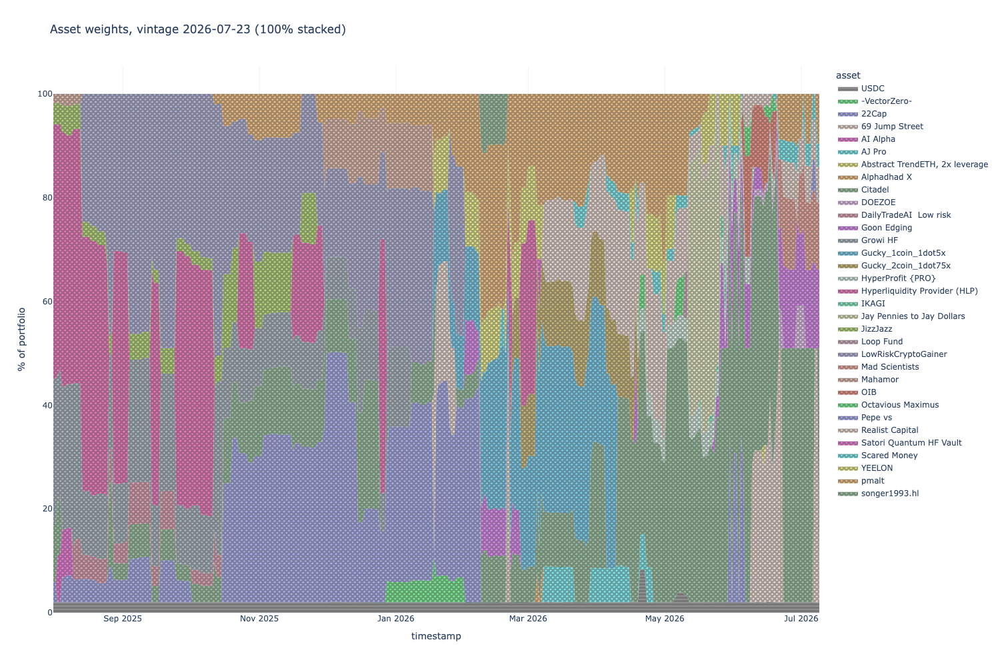

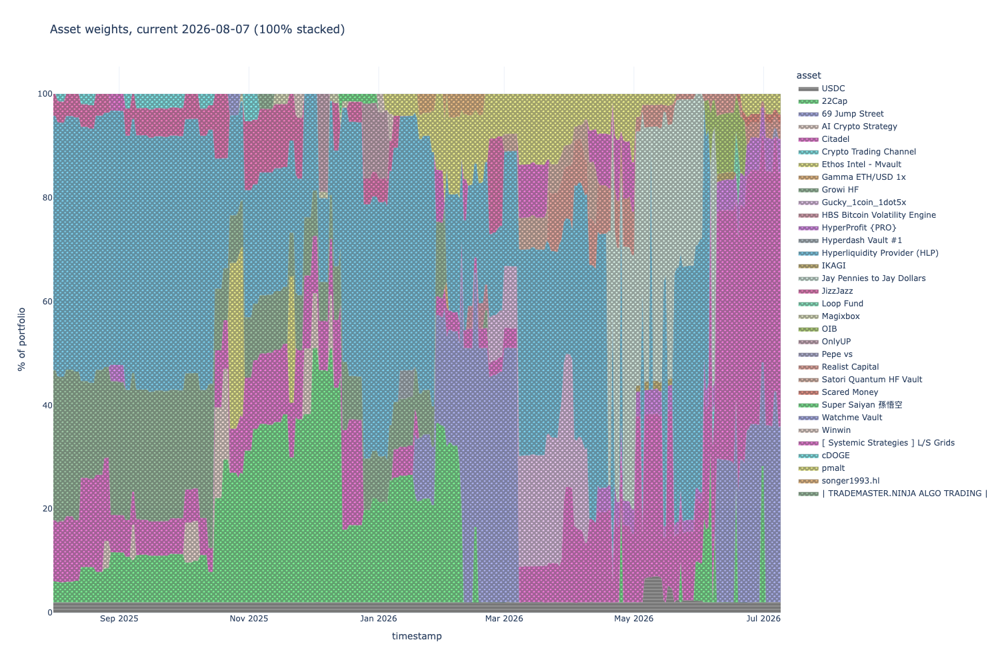

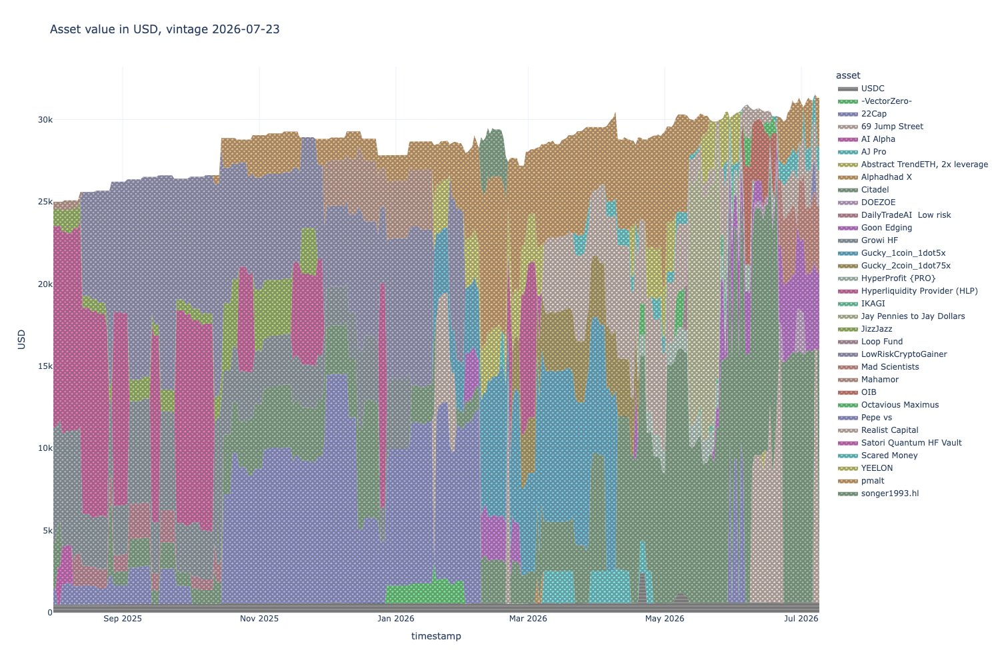

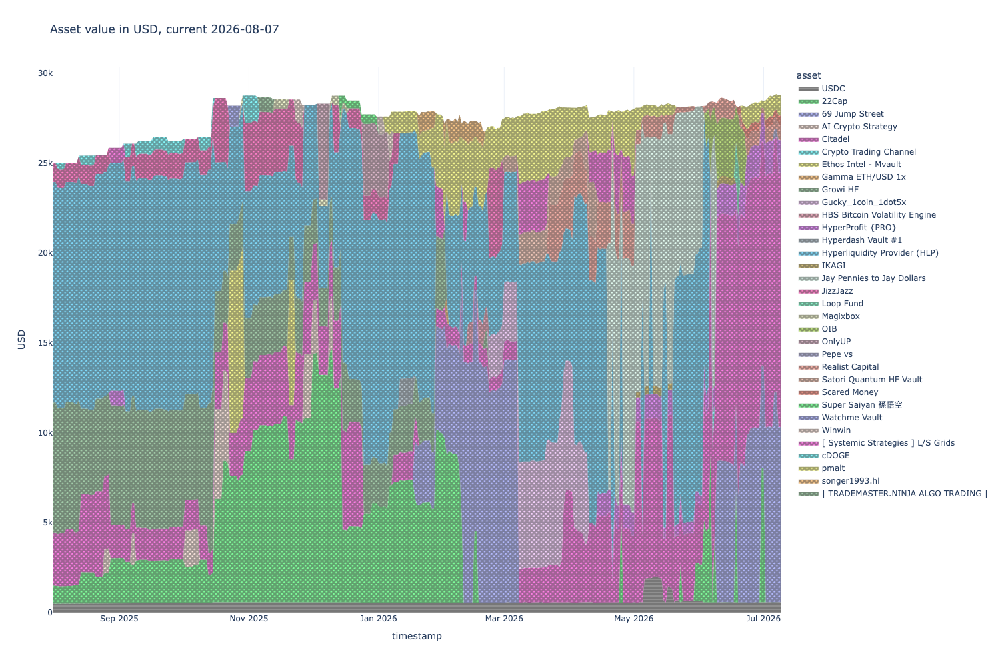

--- weight statistics, vintage 2026-07-23


,At,Pair,Value
Name,,,
Max position (excluding USDC),2026-07-07,69 Jump Street,"$15,466.76"
Min position (excluding USDC),2026-05-16,Scared Money,$226.91
Mean position (excluding USDC),,,"$4,654.73"
Max position (excluding USDC),2026-05-07,Citadel,51.04%
Min position (excluding USDC),2026-05-16,Scared Money,0.77%
Mean position (excluding USDC),,,16.67%
Max position (including USDC),2026-05-04,Citadel,49.04%
Min position (including USDC),2026-05-16,Scared Money,0.75%
Mean position (including USDC),,,14.29%


--- weight statistics, current 2026-08-07


,At,Pair,Value
Name,,,
Max position (excluding USDC),2026-07-07,Citadel,"$14,128.61"
Min position (excluding USDC),2026-06-03,IKAGI,$169.58
Mean position (excluding USDC),,,"$4,568.41"
Max position (excluding USDC),2026-05-12,Jay Pennies to Jay Dollars,52.70%
Min position (excluding USDC),2026-06-03,IKAGI,0.61%
Mean position (excluding USDC),,,16.93%
Max position (including USDC),2025-12-10,22Cap,49.02%
Min position (including USDC),2026-06-03,IKAGI,0.60%
Mean position (including USDC),,,14.48%


In [9]:
from tradeexecutor.analysis.weights import calculate_asset_weights, visualise_weights, calculate_weights_statistics
from tradeexecutor.utils.notebook import display_dataframe_with_html

weights = {label: calculate_asset_weights(run['state']) for label, run in runs.items()}

for label, series in weights.items():
    fig = visualise_weights(
        series,
        normalised=True,
        template='plotly_white',
        chart_title=f'Asset weights, {label} (100% stacked)',
    )
    fig.show()

for label, series in weights.items():
    fig = visualise_weights(
        series,
        normalised=False,
        template='plotly_white',
        chart_title=f'Asset value in USD, {label}',
        y_axis_title='USD',
    )
    fig.show()

for label, series in weights.items():
    print(f'--- weight statistics, {label}')
    display_dataframe_with_html(calculate_weights_statistics(series))


## 1b. Concentration and breadth over time

A basket that holds fewer names, or leans harder on one, behaves differently even with identical
rules. This compares how many vaults were held each day and how much sat in the largest one.

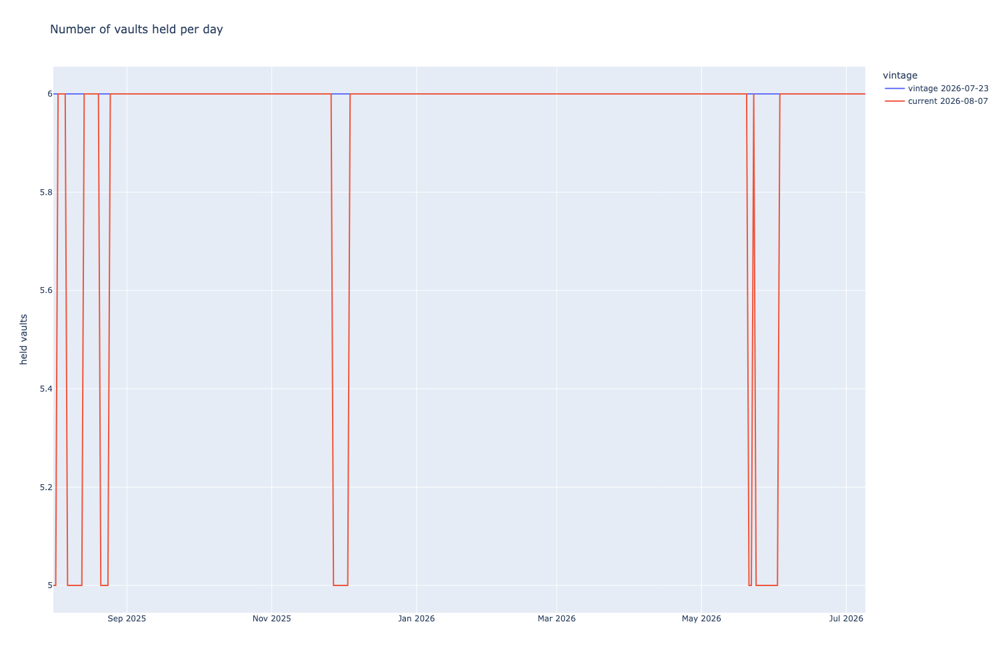

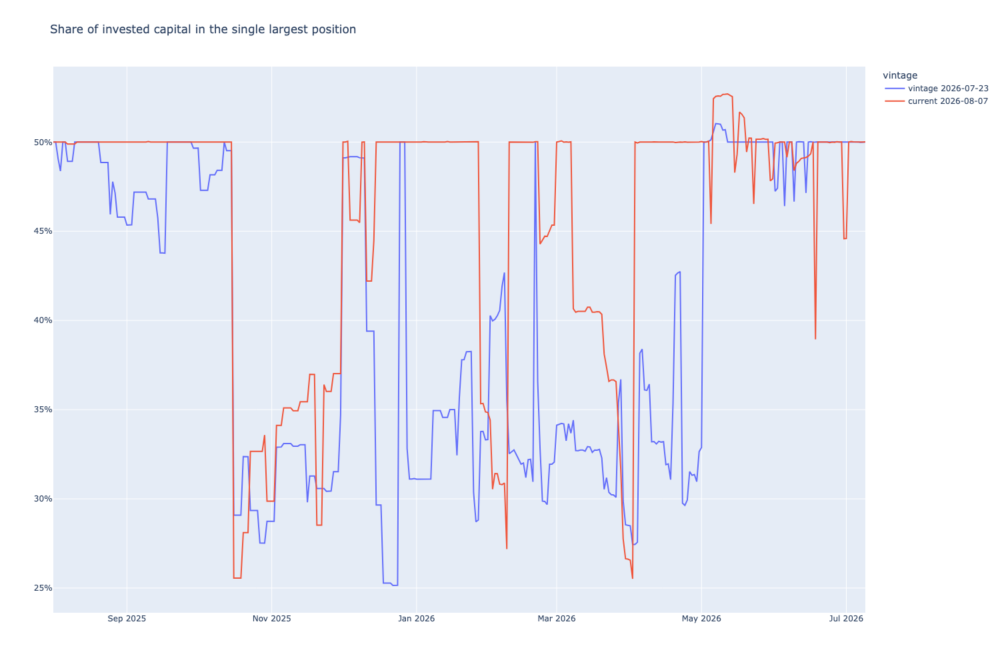

,mean held vaults,min held vaults,mean largest weight,max largest weight,mean invested USD
vintage,,,,,
current 2026-08-07,5.91,5,45.8%,52.7%,"$26,984"
vintage 2026-07-23,6.00,6,40.2%,51.0%,"$27,928"


In [10]:
def weight_frame(series: pd.Series) -> pd.DataFrame:
    """Weights series (timestamp, asset) -> wide USD frame, reserves dropped."""
    frame = series.unstack(level=1).fillna(0.0)
    reserve_symbol = 'USDC'
    return frame.drop(columns=[c for c in frame.columns if c == reserve_symbol], errors='ignore')


breadth_rows = []
for label, series in weights.items():
    frame = weight_frame(series)
    invested = frame.sum(axis=1)
    shares = frame.div(invested.replace(0.0, np.nan), axis=0)
    breadth_rows.append(pd.DataFrame({
        'held vaults': (frame > 0).sum(axis=1),
        'largest weight': shares.max(axis=1),
        'invested USD': invested,
        'vintage': label,
    }))
breadth = pd.concat(breadth_rows).rename_axis('date').reset_index()

fig = px.line(breadth, x='date', y='held vaults', color='vintage',
              title='Number of vaults held per day')
fig.update_xaxes(title='')
fig.show()

fig = px.line(breadth, x='date', y='largest weight', color='vintage',
              title='Share of invested capital in the single largest position')
fig.update_yaxes(tickformat='.0%', title='')
fig.update_xaxes(title='')
fig.show()

display(
    breadth.groupby('vintage').agg(
        **{
            'mean held vaults': ('held vaults', 'mean'),
            'min held vaults': ('held vaults', 'min'),
            'mean largest weight': ('largest weight', 'mean'),
            'max largest weight': ('largest weight', 'max'),
            'mean invested USD': ('invested USD', 'mean'),
        }
    ).style.format({
        'mean held vaults': '{:.2f}', 'min held vaults': '{:.0f}',
        'mean largest weight': '{:.1%}', 'max largest weight': '{:.1%}',
        'mean invested USD': '${:,.0f}',
    })
)


# 2. Pair analysis

Every vault, in both vintages: was its price history present, what did it return over the window,
did the strategy select it, and what did it earn. This separates *the data changed* from *the
choice changed*.

,vaults with in-window history,median return,90th percentile,share positive,series above +1000%
vintage,,,,,
vintage 2026-07-23,572,-9.5%,37.9%,32.9%,0
current 2026-08-07,350,-15.1%,36.4%,30.6%,0


Vaults with price history in either vintage: 572   traded in either run: 46


,vault,pnl old,pnl new,pnl delta,return old,return new,positions old,positions new
0x77fee2df7bad4f1db93052fa82bf78eaab771a16,Realist Ca,"$2,489",$676,"$-1,813",502%,502%,4,4
0x1e37a337ed460039d1b15bd3bc489de789768d5e,Growi HF,"$1,730","$1,491",$-239,21%,21%,1,2
0x4dec0a851849056e259128464ef28ce78afa27f6,pmalt,"$1,336",$782,$-554,138%,138%,5,2
0x2431edfcb662e6ff6deab113cc91878a0b53fb0f,Goon Edgin,"$1,314",$0,"$-1,314",77%,77%,6,0
0xd57c9295947b5a616a3933344ef03a1ad67318ea,LowRiskCry,"$1,241",$0,"$-1,241",19%,19%,2,0
0xba939edf38c0ae0cc689c98b492e0535f43e4550,22Cap,$783,$321,$-462,24%,24%,8,8
0x5290ab34acb59cfe1371baa5782eba14433d308f,Scared Mon,$395,$106,$-289,182%,182%,8,2
0xc22db2c04e054786426671cec0b766c07304fb20,HyperProfi,$337,$509,$172,-4%,-4%,2,3
0xd2f03635901956b950737bbf02463dfad9f2e9e1,Gucky_1coi,$300,$-209,$-509,54%,54%,1,1
0xdfc24b077bc1425ad1dea75bcb6f8158e10df303,Hyperliqui,$252,"$1,176",$925,15%,15%,9,8


,vaults,pnl_old,pnl_new,lost
status,,,,
dropped from dataset,1,$125,$0,$-125
"present, never selected",3,"$2,602",$0,"$-2,602"
"still traded, earned less",7,"$7,045","$3,125","$-3,921"
"still traded, earned same or more",4,$767,"$2,318","$1,551"


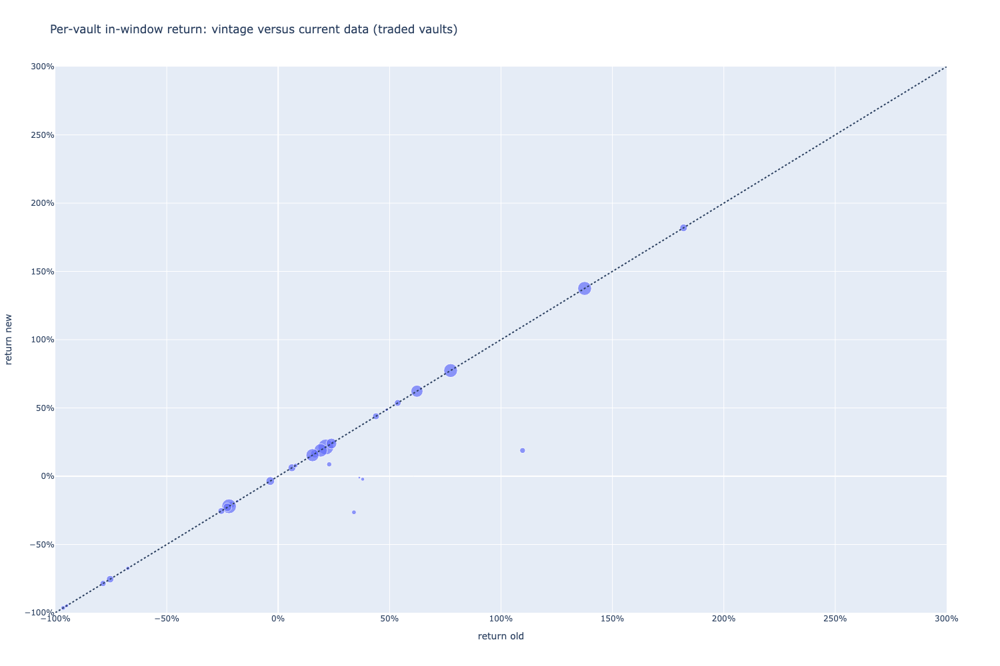

In [11]:
import pyarrow.parquet as pq

WINDOW = (pd.Timestamp(Parameters.backtest_start), pd.Timestamp(Parameters.backtest_end))
PRICE_FILES = {
    OLD_LABEL: ARCHIVE / 'restored' / 'vault-price-history.20260723.parquet',
    NEW_LABEL: ARCHIVE / 'notebook-cache' / 'vault-price-history.live-20260807.parquet',
}


def vintage_returns(parquet_path: Path) -> pd.Series:
    """Per-vault in-window return straight from a price-history parquet.

    Windows on ``timestamp`` (the observation time). Archived exports carry it as the
    parquet index rather than a column, and ``written_at`` is the poll time - using it
    gives materially wrong answers.
    """
    names = set(pq.ParquetFile(str(parquet_path)).schema_arrow.names)
    ts_col = 'timestamp' if 'timestamp' in names else '__index_level_0__'
    df = pq.read_table(
        str(parquet_path),
        columns=['chain', 'address', 'share_price', ts_col],
        filters=[('chain', '==', 9999)],
    ).to_pandas()
    if ts_col not in df.columns:
        df = df.reset_index()
        ts_col = [c for c in df.columns if c not in ('chain', 'address', 'share_price')][0]
    df = df.rename(columns={ts_col: 'ts'})
    df['ts'] = pd.to_datetime(df['ts'])
    w = df[(df.ts >= WINDOW[0]) & (df.ts <= WINDOW[1])].sort_values('ts')
    g = w.groupby('address')['share_price']
    return (g.last() / g.first() - 1.0).replace([np.inf, -np.inf], np.nan)


returns_by_vintage = {label: vintage_returns(path) for label, path in PRICE_FILES.items()}

cross_rows = []
for label, series in returns_by_vintage.items():
    valid = series.dropna()
    cross_rows.append({
        'vintage': label,
        'vaults with in-window history': valid.size,
        'median return': float(valid.median()),
        '90th percentile': float(valid.quantile(0.9)),
        'share positive': float((valid > 0).mean()),
        'series above +1000%': int((valid > 10).sum()),
    })
display(pd.DataFrame(cross_rows).set_index('vintage').style.format({
    'median return': '{:.1%}', '90th percentile': '{:.1%}',
    'share positive': '{:.1%}', 'vaults with in-window history': '{:.0f}',
}).set_caption('The ranking cross-section the strategy chooses from'))


def position_pnl(position) -> float:
    """Realised profit plus unrealised mark for a still-open position."""
    pnl = float(position.get_realised_profit_usd() or 0.0)
    if position.is_open():
        try:
            pnl += float(position.get_unrealised_profit_usd() or 0.0)
        except Exception:
            pass
    return pnl


def position_frame(run) -> pd.DataFrame:
    rows = []
    for p in run['positions']:
        rows.append({
            'vault': p.pair.base.token_symbol,
            'address': p.pair.pool_address.lower(),
            'opened_at': p.opened_at,
            'closed_at': p.closed_at,
            'days_held': ((p.closed_at or Parameters.backtest_end) - p.opened_at).days,
            'trades': len(p.trades),
            'pnl': position_pnl(p),
        })
    return pd.DataFrame(rows)


positions = {label: position_frame(run) for label, run in runs.items()}

pairs = pd.DataFrame(index=sorted(set(returns_by_vintage[OLD_LABEL].dropna().index)
                                  | set(returns_by_vintage[NEW_LABEL].dropna().index)))
pairs['return old'] = returns_by_vintage[OLD_LABEL]
pairs['return new'] = returns_by_vintage[NEW_LABEL]
for label in (OLD_LABEL, NEW_LABEL):
    grouped = positions[label].groupby('address')
    suffix = 'old' if label == OLD_LABEL else 'new'
    pairs[f'pnl {suffix}'] = grouped['pnl'].sum()
    pairs[f'positions {suffix}'] = grouped.size()
    pairs[f'days held {suffix}'] = grouped['days_held'].sum()
pairs = pairs.fillna({c: 0.0 for c in pairs.columns if c.startswith(('pnl', 'positions', 'days held'))})

names = {}
for label, universe in universes.items():
    for pair in universe.iterate_pairs():
        if pair.is_vault():
            names.setdefault(pair.pool_address.lower(), pair.base.token_symbol)
pairs.insert(0, 'vault', [names.get(a, '?') for a in pairs.index])
pairs['pnl delta'] = pairs['pnl new'] - pairs['pnl old']

traded = pairs[(pairs['positions old'] > 0) | (pairs['positions new'] > 0)].copy()
print(f'Vaults with price history in either vintage: {len(pairs)}   traded in either run: {len(traded)}')

display(
    traded.reindex(traded['pnl old'].sort_values(ascending=False).index).head(15)[
        ['vault', 'pnl old', 'pnl new', 'pnl delta', 'return old', 'return new', 'positions old', 'positions new']
    ].style.format({
        'pnl old': '${:,.0f}', 'pnl new': '${:,.0f}', 'pnl delta': '${:,.0f}',
        'return old': '{:.0%}', 'return new': '{:.0%}',
        'positions old': '{:.0f}', 'positions new': '{:.0f}',
    }).set_caption('Top 15 earners of the vintage run, and what they did on current data')
)


def classify(row) -> str:
    """Why a vault that earned in the vintage run no longer earns."""
    if pd.isna(row['return new']):
        return 'dropped from dataset'
    if row['positions new'] == 0:
        return 'present, never selected'
    if row['pnl new'] < row['pnl old']:
        return 'still traded, earned less'
    return 'still traded, earned same or more'


winners = traded[traded['pnl old'] > 0].copy()
winners['status'] = winners.apply(classify, axis=1)
summary = winners.groupby('status').agg(
    vaults=('vault', 'size'), pnl_old=('pnl old', 'sum'), pnl_new=('pnl new', 'sum'),
)
summary['lost'] = summary.pnl_new - summary.pnl_old
display(summary.style.format({'pnl_old': '${:,.0f}', 'pnl_new': '${:,.0f}', 'lost': '${:,.0f}'})
        .set_caption('What became of every vault that made money on the vintage data'))

fig = px.scatter(
    traded.assign(size_metric=traded[['pnl old', 'pnl new']].abs().max(axis=1).clip(1, None)),
    x='return old', y='return new', size='size_metric', hover_name='vault',
    title='Per-vault in-window return: vintage versus current data (traded vaults)',
)
fig.add_shape(type='line', x0=-1, y0=-1, x1=3, y1=3, line=dict(dash='dot'))
fig.update_xaxes(tickformat='.0%', range=[-1, 3])
fig.update_yaxes(tickformat='.0%', range=[-1, 3])
fig.show()


# 3. Position analysis

Every position from both runs. Positions are matched on vault and overlapping dates, so a position
that exists in one run and not the other is visible as such.

--- vintage 2026-07-23: 101 positions, total PnL $6,692


,vault,opened_at,closed_at,days_held,trades,pnl
27,Growi HF,2025-08-01 00:00:00,2026-01-08 00:00:00,160,69,"$1,730"
30,LowRiskCry,2025-08-14 00:00:00,2026-01-18 00:00:00,157,66,"$1,559"
65,pmalt,2025-11-27 00:00:00,2026-05-21 00:00:00,175,121,"$1,483"
1,Realist Ca,2026-06-23 00:00:00,NaT,17,16,"$1,467"
72,Realist Ca,2026-03-08 00:00:00,2026-05-30 00:00:00,83,72,$990
29,22Cap,2025-10-16 00:00:00,2026-01-18 00:00:00,94,38,$966
40,Goon Edgin,2026-02-01 00:00:00,2026-02-20 00:00:00,19,19,$610
0,Goon Edgin,2026-06-20 00:00:00,NaT,20,18,$512
81,Goon Edgin,2026-05-29 00:00:00,2026-06-14 00:00:00,16,17,$500
63,Scared Mon,2026-04-26 00:00:00,2026-05-17 00:00:00,21,22,$500


,vault,opened_at,closed_at,days_held,trades,pnl
39,songer1993,2026-02-08 00:00:00,2026-02-20 00:00:00,12,12,"$-1,489"
31,Citadel,2026-01-08 00:00:00,2026-01-19 00:00:00,11,4,$-536
38,Scared Mon,2026-02-17 00:00:00,2026-02-19 00:00:00,2,3,$-511
93,Mad Scient,2026-06-21 00:00:00,2026-06-29 00:00:00,8,9,$-421
23,JizzJazz,2025-11-20 00:00:00,2025-11-27 00:00:00,7,4,$-366
36,22Cap,2026-01-19 00:00:00,2026-02-08 00:00:00,20,20,$-359
34,LowRiskCry,2026-01-25 00:00:00,2026-02-01 00:00:00,7,7,$-318
99,Pepe vs,2026-07-06 00:00:00,2026-07-08 00:00:00,2,3,$-297


--- current 2026-08-07: 95 positions, total PnL $5,041


,vault,opened_at,closed_at,days_held,trades,pnl
45,Growi HF,2025-08-01 00:00:00,2026-02-02 00:00:00,185,92,"$1,453"
0,Citadel,2026-01-28 00:00:00,NaT,163,121,"$1,283"
42,Hyperliqui,2025-08-01 00:00:00,2026-01-28 00:00:00,180,53,"$1,208"
74,pmalt,2026-01-04 00:00:00,2026-05-21 00:00:00,137,82,$763
3,Realist Ca,2026-06-23 00:00:00,NaT,17,13,$546
93,HyperProfi,2026-04-14 00:00:00,2026-07-06 00:00:00,83,35,$481
21,Ethos Inte,2025-10-23 00:00:00,2025-10-30 00:00:00,7,3,$417
47,22Cap,2025-08-01 00:00:00,2026-02-10 00:00:00,193,98,$332
55,69 Jump St,2026-01-18 00:00:00,2026-03-08 00:00:00,49,42,$323
76,Realist Ca,2026-03-22 00:00:00,2026-05-30 00:00:00,69,52,$291


,vault,opened_at,closed_at,days_held,trades,pnl
40,Citadel,2026-01-08 00:00:00,2026-01-20 00:00:00,12,6,$-406
51,songer1993,2026-02-03 00:00:00,2026-02-20 00:00:00,17,17,$-403
17,AI Crypto,2025-10-16 00:00:00,2025-10-23 00:00:00,7,4,$-279
48,[ Systemic,2026-02-10 00:00:00,2026-02-12 00:00:00,2,3,$-256
22,cDOGE,2025-10-30 00:00:00,2025-11-06 00:00:00,7,4,$-216
57,Gucky_1coi,2026-02-22 00:00:00,2026-04-10 00:00:00,47,39,$-209
27,JizzJazz,2025-10-30 00:00:00,2025-11-27 00:00:00,28,14,$-202
86,Realist Ca,2026-06-03 00:00:00,2026-06-18 00:00:00,15,16,$-164


,positions,winners,win rate,mean win,mean loss,total PnL,median days held
vintage,,,,,,,
vintage 2026-07-23,101,48,47.5%,$284,$-174,"$6,692",8
current 2026-08-07,95,42,44.2%,$209,$-89,"$5,041",7


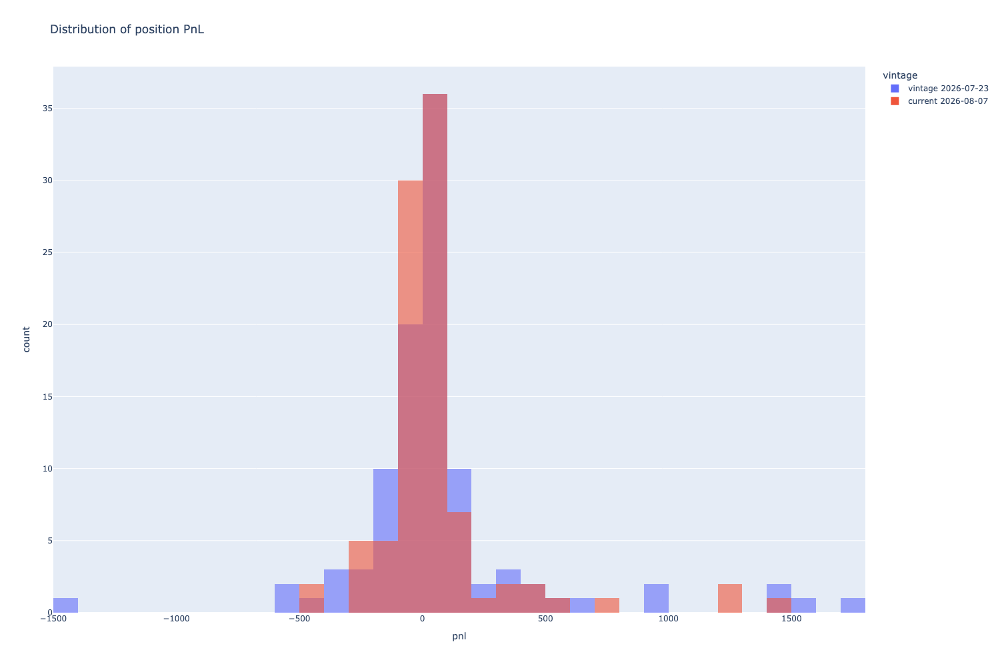

Vaults traded only on vintage data: 14 (37 positions, $1,874)
Vaults traded only on current data: 14 (37 positions, $-734)


,positions,pnl
vault,,
Goon Edgin,6,"$1,314"
LowRiskCry,2,"$1,241"
Alphadhad,2,$125
Gucky_2coi,1,$46
AI Alpha,1,$0
AJ Pro,3,$-0
YEELON,8,$-0
Abstract T,1,$-9
DailyTrade,2,$-80


In [12]:
for label in (OLD_LABEL, NEW_LABEL):
    frame = positions[label]
    print(f'--- {label}: {len(frame)} positions, total PnL ${frame.pnl.sum():,.0f}')
    display(
        frame.sort_values('pnl', ascending=False).head(10)[
            ['vault', 'opened_at', 'closed_at', 'days_held', 'trades', 'pnl']
        ].style.format({'pnl': '${:,.0f}', 'days_held': '{:.0f}', 'trades': '{:.0f}'})
        .set_caption(f'Best positions, {label}')
    )
    display(
        frame.sort_values('pnl').head(8)[
            ['vault', 'opened_at', 'closed_at', 'days_held', 'trades', 'pnl']
        ].style.format({'pnl': '${:,.0f}', 'days_held': '{:.0f}', 'trades': '{:.0f}'})
        .set_caption(f'Worst positions, {label}')
    )

stats_rows = []
for label, frame in positions.items():
    wins = frame[frame.pnl > 0]
    losses = frame[frame.pnl < 0]
    stats_rows.append({
        'vintage': label,
        'positions': len(frame),
        'winners': len(wins),
        'win rate': len(wins) / len(frame) if len(frame) else np.nan,
        'mean win': wins.pnl.mean(),
        'mean loss': losses.pnl.mean(),
        'total PnL': frame.pnl.sum(),
        'median days held': frame.days_held.median(),
    })
display(pd.DataFrame(stats_rows).set_index('vintage').style.format({
    'win rate': '{:.1%}', 'mean win': '${:,.0f}', 'mean loss': '${:,.0f}',
    'total PnL': '${:,.0f}', 'median days held': '{:.0f}',
}).set_caption('Position-level profile'))

fig = px.histogram(
    pd.concat([positions[label].assign(vintage=label) for label in positions]),
    x='pnl', color='vintage', barmode='overlay', nbins=60, opacity=0.6,
    title='Distribution of position PnL',
)
fig.show()

# Positions unique to one run, by vault
old_vaults = set(positions[OLD_LABEL].address)
new_vaults = set(positions[NEW_LABEL].address)
only_old = positions[OLD_LABEL][~positions[OLD_LABEL].address.isin(new_vaults)]
only_new = positions[NEW_LABEL][~positions[NEW_LABEL].address.isin(old_vaults)]
print(f'Vaults traded only on vintage data: {only_old.address.nunique()} '
      f'({len(only_old)} positions, ${only_old.pnl.sum():,.0f})')
print(f'Vaults traded only on current data: {only_new.address.nunique()} '
      f'({len(only_new)} positions, ${only_new.pnl.sum():,.0f})')
display(
    only_old.groupby('vault').agg(positions=('pnl', 'size'), pnl=('pnl', 'sum'))
    .sort_values('pnl', ascending=False).head(10)
    .style.format({'pnl': '${:,.0f}'}).set_caption('Vaults the strategy lost access to')
)


# 4. Why did it stop being profitable?

Two candidate explanations, and they are separable:

- **Selection** - the revised cross-section made the ranking pick different vaults
- **Performance** - the same kind of allocation simply earned less because the vaults themselves
  were revised down

The test cross-applies weights and returns. Take each run's daily portfolio weights and each
vintage's daily vault returns, then compute the portfolio return for all four combinations. If
*old weights on new returns* stays profitable, selection was the problem; if it collapses, the
assets were.

,weights from,returns from,cumulative return,mean daily,volatility (ann.),coverage (days)
0,vintage 2026-07-23,vintage 2026-07-23,5.78%,0.0178%,10.3%,343
1,vintage 2026-07-23,current 2026-08-07,5.78%,0.0178%,10.3%,343
2,current 2026-08-07,vintage 2026-07-23,4.26%,0.0130%,7.9%,343
3,current 2026-08-07,current 2026-08-07,4.26%,0.0130%,7.9%,343


returns from,current 2026-08-07,vintage 2026-07-23
weights from,,
current 2026-08-07,4.26%,4.26%
vintage 2026-07-23,5.78%,5.78%


Holding the vintage allocation fixed and swapping in current returns: -0.00 pp
Then letting the strategy re-select on current data:                   -1.52 pp


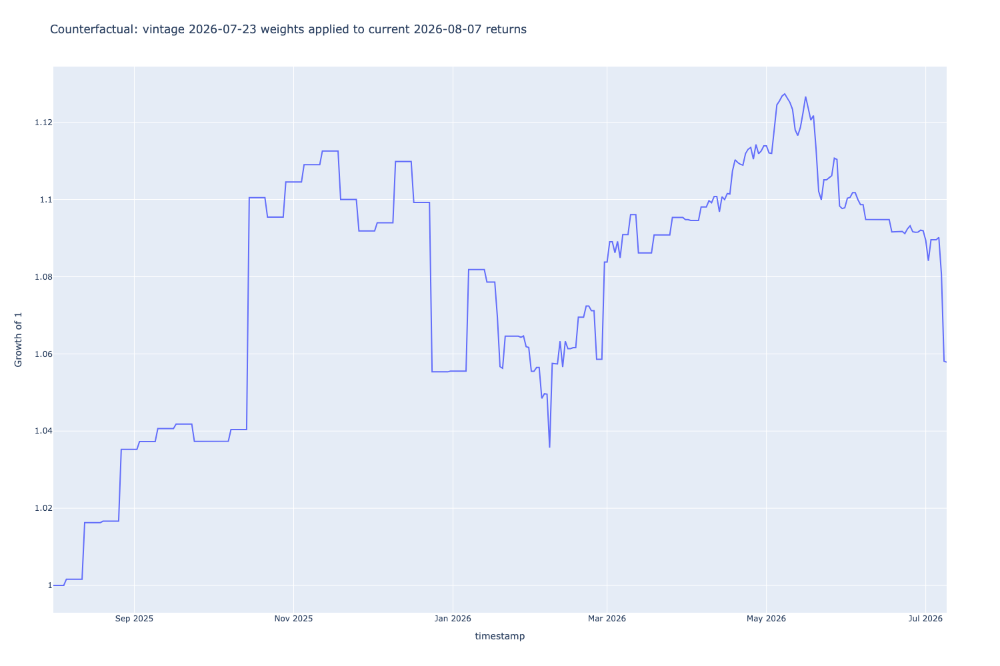

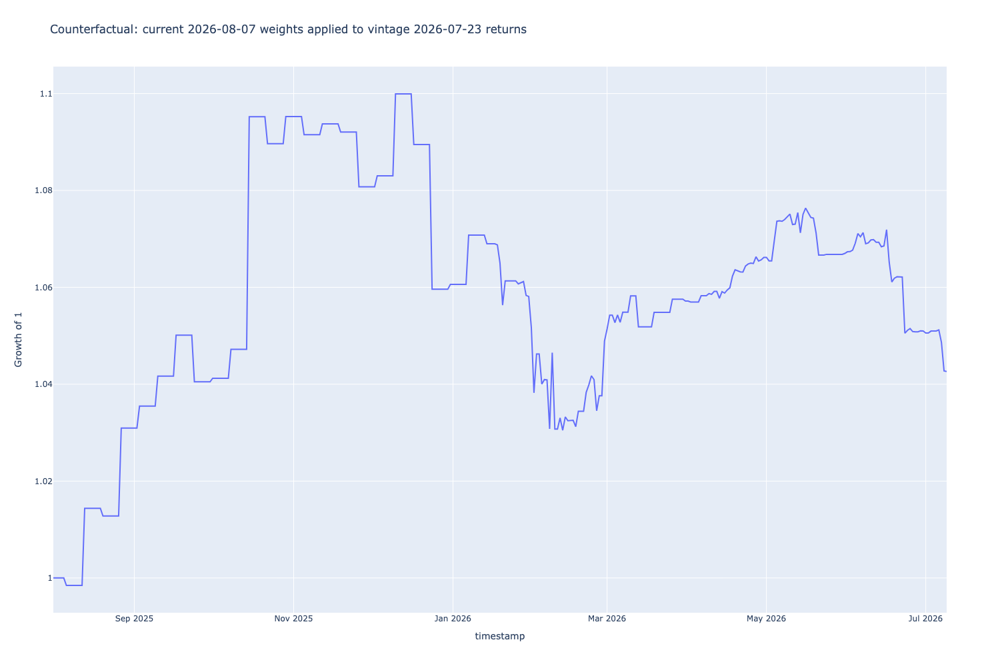

In [13]:
def daily_vault_returns(universe, label) -> pd.DataFrame:
    """Daily close-to-close return per vault symbol, from a universe's candles."""
    frames = {}
    for pair in universe.iterate_pairs():
        if not pair.is_vault():
            continue
        try:
            candles = universe.data_universe.candles.get_candles_by_pair(pair.internal_id)
        except Exception:
            continue
        if candles is None or not len(candles):
            # Vault present in the universe but without candles in this vintage
            continue
        closes = candles.set_index('timestamp')['close'].sort_index()
        closes = closes[~closes.index.duplicated(keep='last')]
        frames[pair.base.token_symbol] = closes.pct_change()
    return pd.DataFrame(frames)


vault_returns = {label: daily_vault_returns(universes[label], label) for label in universes}

# Normalised weights per day, reserves excluded, shifted so today's return uses yesterday's weights
weight_shares = {}
for label, series in weights.items():
    frame = weight_frame(series)
    frame = frame.resample('1D').last().ffill()
    shares = frame.div(frame.sum(axis=1).replace(0.0, np.nan), axis=0).fillna(0.0)
    weight_shares[label] = shares.shift(1).fillna(0.0)

combos = {}
for w_label, shares in weight_shares.items():
    for r_label, rets in vault_returns.items():
        common_cols = shares.columns.intersection(rets.columns)
        idx = shares.index.intersection(rets.index)
        contrib = (shares.loc[idx, common_cols] * rets.loc[idx, common_cols].fillna(0.0)).sum(axis=1)
        combos[(w_label, r_label)] = contrib

rows = []
for (w_label, r_label), series in combos.items():
    cumulative = float((1 + series).prod() - 1)
    rows.append({
        'weights from': w_label,
        'returns from': r_label,
        'cumulative return': cumulative,
        'mean daily': float(series.mean()),
        'volatility (ann.)': float(series.std() * np.sqrt(365)),
        'coverage (days)': int(series.size),
    })
cross = pd.DataFrame(rows)
display(cross.style.format({
    'cumulative return': '{:.2%}', 'mean daily': '{:.4%}', 'volatility (ann.)': '{:.1%}',
}).set_caption('Cross-applied weights and returns: which factor moves the result'))

pivot = cross.pivot(index='weights from', columns='returns from', values='cumulative return')
display(pivot.style.format('{:.2%}').background_gradient(cmap='RdYlGn')
        .set_caption('Cumulative portfolio return, weights (rows) x vault returns (columns)'))

same_weights_effect = pivot.loc[OLD_LABEL, NEW_LABEL] - pivot.loc[OLD_LABEL, OLD_LABEL]
same_returns_effect = pivot.loc[NEW_LABEL, NEW_LABEL] - pivot.loc[OLD_LABEL, NEW_LABEL]
print(f'Holding the vintage allocation fixed and swapping in current returns: '
      f'{100*same_weights_effect:+.2f} pp')
print(f'Then letting the strategy re-select on current data:                   '
      f'{100*same_returns_effect:+.2f} pp')

for (w_label, r_label), series in combos.items():
    if w_label == r_label:
        continue
    fig = px.line((1 + series).cumprod(),
                  title=f'Counterfactual: {w_label} weights applied to {r_label} returns')
    fig.update_layout(showlegend=False)
    fig.update_yaxes(title='Growth of 1')
    fig.show()


## 4b. Where in time the two runs diverge

Monthly returns side by side, and the contribution of each month to the final equity gap.

,vintage 2026-07-23,current 2026-08-07,difference
0,,,
2025-08,4.91%,3.37%,1.54%
2025-09,0.69%,1.50%,-0.80%
2025-10,10.03%,9.63%,0.39%
2025-11,-0.80%,-1.78%,0.98%
2025-12,-3.40%,-2.32%,-1.08%
2026-01,1.73%,0.07%,1.66%
2026-02,-0.99%,-0.68%,-0.31%
2026-03,5.32%,2.38%,2.94%
2026-04,-1.36%,-0.47%,-0.89%


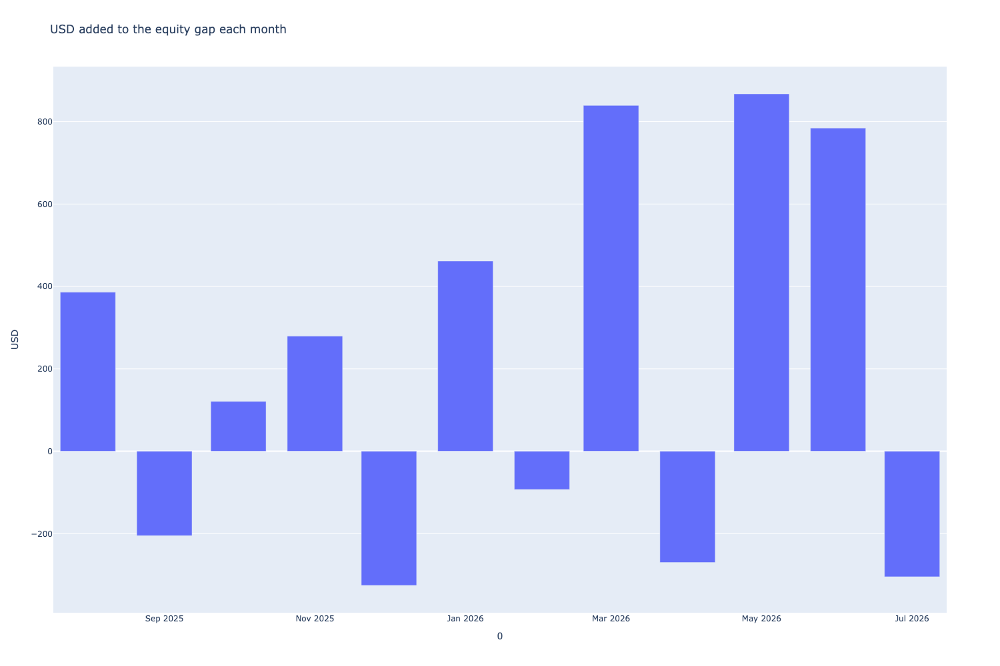

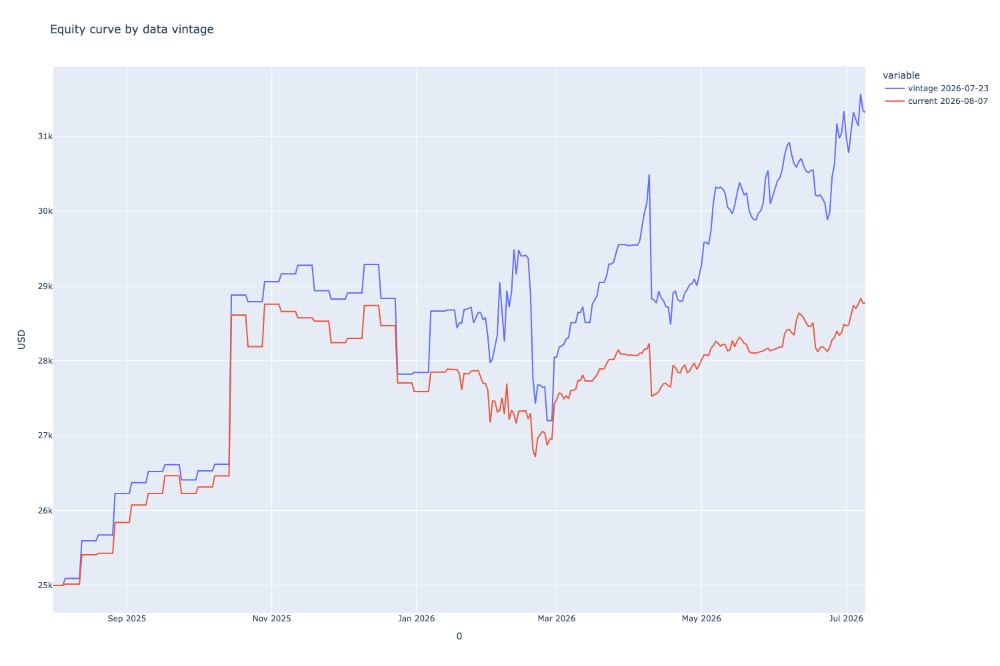

In [14]:
monthly = pd.DataFrame({
    label: run['returns'].resample('1ME').apply(lambda s: (1 + s).prod() - 1)
    for label, run in runs.items()
})
monthly['difference'] = monthly[OLD_LABEL] - monthly[NEW_LABEL]
monthly.index = monthly.index.strftime('%Y-%m')
display(monthly.style.format('{:.2%}').background_gradient(subset=['difference'], cmap='RdYlGn')
        .set_caption('Monthly returns by data vintage'))

gap = (runs[OLD_LABEL]['equity'] - runs[NEW_LABEL]['equity'])
monthly_gap = gap.resample('1ME').last().diff().fillna(gap.resample('1ME').last().iloc[0])
monthly_gap.index = monthly_gap.index.strftime('%Y-%m')
fig = px.bar(monthly_gap, title='USD added to the equity gap each month')
fig.update_layout(showlegend=False)
fig.update_yaxes(title='USD')
fig.show()

equity_df = pd.DataFrame({label: run['equity'] for label, run in runs.items()}).ffill()
fig = px.line(equity_df, title='Equity curve by data vintage')
fig.update_yaxes(title='USD')
fig.show()
